# **Spotify Music Data Analysis**
This is a notebook prepared following CRISP-DM 1.0 methodology to help in the analysis of data for the music tracks hosted on Spotify platform. The purpose of the analysis is to help in classification of music genres as well as predict tracks popularity based on the available historical data.

## **Analysis Design**
1. Business Understanding
  * Business background, situation and goals 
  * Data analysis questions
  * Metrics of success <br>

2. Data Understanding and Exploration 
  * Prerequisites
     * Load requisite libraries 
     * Load datasets.
  * Data exploration<br>
  * Data quality assessment (Accuracy, Completeness, Consistency, Currency, Relevance, Validity and Uniqueness).

3. Data Preparation and Analysis
  * Data selection
  * Data cleaning
  * Data integration and formatting
  * Data transformation (merging datasets, reformatting fields, filtering records, ...) and enrichment (feature engineering)

4. Data Modeling
 * Cluster Analysis
 * Regression Analysis

5. Solution Implementation & Reporting

## **1. Business Scenario**

### **1.1 Understanding context**
Spotify Technology is a Swedish music streaming and media services provider that
provides an audio streaming platform, the "Spotify" platform, that offers Digital Restrictions Management (DRM)-restricted music and podcasts from record labels and media companies.

The Spotify platform provides access to over 50 million tracks. Users can browse by parameters such as artist, album, or genre, and can create, edit, and share playlists.

The service is available in most of Europe and the Americas, Australia, New Zealand, and parts of Africa and Asia, and on most modern devices, including Windows, macOS, and Linux computers, and iOS, and Android smartphones and tablets.

The business objective of Spotify is to:
1. Increase revenue through the identification and presentation of popular songs early enough.
2. Identifying new genres of music by segmenting tracks hosted on their platform.

### **1.2 Data analysis question**
Using the available data; 
1. Spotify would like to build a machine learning model that predicts track popularity in an effort to increase revenue. 

2. Spotify would like to build a data model that segments the tracks so as to help in identifying new genres of music.



### **1.3 Metrics of success** 
Our research will be successful if we are able to;
1. Build a machine learning model that predicts track popularity with over 60% accuracy. For this model, we will use accuracy and F1 score to evaluate its performance / effectiveness.

2. Build a machine learning model that distinctively clusters music tracks in order to discover genres.


## **2. Data Understanding and Exploration**

### **2.1 Prerequisites**

In [1]:
# Loading necessary libraries for;

# data manipulation
import pandas as pd

# display all columns and entire contents of a cell
pd.set_option('display.max.columns', None)
pd.set_option('display.max_colwidth', None)

# number crunching, extended array operations
import numpy as np

# visualization with all graphs being within the notebook, 
# standardize the plot size and color codes
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10.0, 8.0)
%matplotlib inline

import seaborn as sns
sns.set_color_codes(palette='pastel')

In [2]:
# Connecting to Google drive to access source files and load dataset to colab.

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Helper Method to check for duplicated columns.

def getDuplicateColumns(df): 
  
    # Create an empty set 
    duplicateColumnNames = set() 
      
    # Iterate through all the columns  
    # of dataframe 
    for x in range(df.shape[1]): 
          
        # Take column at xth index. 
        col = df.iloc[:, x] 
          
        # Iterate through all the columns in 
        # DataFrame from (x + 1)th index to 
        # last index 
        for y in range(x + 1, df.shape[1]): 
              
            # Take column at yth index. 
            otherCol = df.iloc[:, y] 
              
            # Check if two columns at x & y 
            # index are equal or not, 
            # if equal then adding  
            # to the set 
            if col.equals(otherCol): 
                duplicateColumnNames.add(df.columns.values[y]) 
                  
    # Return list of unique column names  
    # whose contents are duplicates. 
    return list(duplicateColumnNames) 

In [4]:
# Helper method to load pandas DataFrame. The helper is useful in that when the path of the file changes,
# we will only need to change the url only in this helper.

def getDataFrame (file_name):
    
    # Set the url (data access location) in  Google drive and include the filename holder.
    data_set_url = '/content/drive/My Drive/Colab Notebooks/Afterwork Fellowship [Nov 2020]/Capstone Project/'+file_name

    # Return the complete url
    return data_set_url


### **2.2 Data exploration**

In [5]:
# Load the glossary of the dataset to aid in data set variables understanding.

glossary_df = pd.read_csv(getDataFrame('spotify_glossary.csv'))
glossary_df

,variable,class,description
0,track_id,str,Song unique ID
1,track_name,str,Song Name
2,track_artist,str,Song Artist
3,track_popularity,float,Song Popularity (0-100) where higher is better
4,track_album_id,str,Album unique ID
5,track_album_name,str,Song album name
6,track_album_release_date,str,Date when album released
7,playlist_name,str,Name of playlist
8,playlist_id,str,Playlist ID
9,playlist_genre,str,Playlist genre


In [6]:
# Load spotify dataset and preview the first 5 records

spotify_df = pd.read_csv('https://bit.ly/SpotifySongsDs')
spotify_df.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxury Remix,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury Remix],2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.748,0.916,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.726,0.815,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.675,0.931,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.718,0.930,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.650,0.833,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


In [7]:
# Preview last 5 records of spotify dataset

spotify_df.tail()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
32828,7bxnKAamR3snQ1VGLuVfC1,City Of Lights - Official Radio Edit,Lush & Simon,42,2azRoBBWEEEYhqV6sb7JrT,City Of Lights (Vocal Mix),2014-04-28,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,progressive electro house,0.428,0.922,2,-1.814,1,0.0936,0.076600,0.000000,0.0668,0.2100,128.170,204375
32829,5Aevni09Em4575077nkWHz,Closer - Sultan & Ned Shepard Remix,Tegan and Sara,20,6kD6KLxj7s8eCE3ABvAyf5,Closer Remixed,2013-03-08,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,progressive electro house,0.522,0.786,0,-4.462,1,0.0420,0.001710,0.004270,0.3750,0.4000,128.041,353120
32830,7ImMqPP3Q1yfUHvsdn7wEo,Sweet Surrender - Radio Edit,Starkillers,14,0ltWNSY9JgxoIZO4VzuCa6,Sweet Surrender (Radio Edit),2014-04-21,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,progressive electro house,0.529,0.821,6,-4.899,0,0.0481,0.108000,0.000001,0.1500,0.4360,127.989,210112
32831,2m69mhnfQ1Oq6lGtXuYhgX,Only For You - Maor Levi Remix,Mat Zo,15,1fGrOkHnHJcStl14zNx8Jy,Only For You (Remixes),2014-01-01,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,progressive electro house,0.626,0.888,2,-3.361,1,0.1090,0.007920,0.127000,0.3430,0.3080,128.008,367432
32832,29zWqhca3zt5NsckZqDf6c,Typhoon - Original Mix,Julian Calor,27,0X3mUOm6MhxR7PzxG95rAo,Typhoon/Storm,2014-03-03,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,progressive electro house,0.603,0.884,5,-4.571,0,0.0385,0.000133,0.341000,0.7420,0.0894,127.984,337500


In [8]:
# Determine the dimensions of the dataset

spotify_df.shape

(32833, 23)

In [9]:
spotify_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

 ***Data Description Report:***

1. *Initial Spotify dataset had 32,833 rows and 23 columns of tracks data.*
2. *Each record has data specific to;*
	* *Tracks : ID, Name, Artist, Popularity, Other track features as danceability, tempo, key, energy, valence, duration, loudness, liveness, etc.* 
	* *Albums : ID, Name, Release Date*
	* *Playlist : ID, Name, Genre, Subgenre*
3. *To address the specific study question, the dataset has a field called `track_popularity` which, though not documented in the project brief, could be founded on chart rankings based on a combination of sales (physical and digital), radio play, and online streaming among other qualities. according to displayr blog (displayr.com) approximate weighting is 35-45% for sales, 30-40% for airplay, and 20-30% for streaming.*
    
    *Secondly, the dataset has playlist genre and subgenre fields which will play a big part in handling the research need to cluster the tracks in order to discover hidden genre patterns (if any).*

### **2.3 Data quality assessment**

In [10]:
# 1. Completeness quality check. Investigate null entries in these datasets?

if spotify_df.isnull().values.any():
    print('Null values exist.\n')
    print(spotify_df.isnull().sum())
else:
    print('No null values in the entire dataset.')

Null values exist.

track_id                    0
track_name                  5
track_artist                5
track_popularity            0
track_album_id              0
track_album_name            5
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64


In [11]:
# Remove the null entries and confirm new dimensions.

spotify_df.dropna(axis=0, how='any', inplace=True)
print(spotify_df.isnull().any(),'\n')
print('New dimension of the dataset:\n', spotify_df.shape)

track_id                    False
track_name                  False
track_artist                False
track_popularity            False
track_album_id              False
track_album_name            False
track_album_release_date    False
playlist_name               False
playlist_id                 False
playlist_genre              False
playlist_subgenre           False
danceability                False
energy                      False
key                         False
loudness                    False
mode                        False
speechiness                 False
acousticness                False
instrumentalness            False
liveness                    False
valence                     False
tempo                       False
duration_ms                 False
dtype: bool 

New dimension of the dataset:
 (32828, 23)


In [12]:
# 2. Uniqueness quality check (Observations): 
# See if we have any duplicated records, if so, drop  them

if spotify_df.duplicated().any():
    print('Null values exist.\n')
    print(spotify_df.isnull().sum())
else:
    print('Great! No duplicated rows exist in the dataset.')

Great! No duplicated rows exist in the dataset.


In [13]:
# See if we have any duplicated columns

duplicated_cols = getDuplicateColumns(spotify_df)

if len(duplicated_cols) > 0:
    print('Duplicate columns found: \n')
    print(duplicated_cols)
else:
    print('Wonderful! No duplicate columns found in the dataset.')

Wonderful! No duplicate columns found in the dataset.


In [14]:
# 3. Accuracy, Consistency and Validity quality checks.
# Confirm datatypes, data categories and correctness of data for ease of manipulation and use later in the analysis.

columns = spotify_df.columns
for col in columns:
    print('Variable:', col)
    print('Number of unique values:',spotify_df[col].nunique(),'\n')
    print(spotify_df[col].unique(),'\n')

Variable: track_id
Number of unique values: 28352 

['6f807x0ima9a1j3VPbc7VN' '0r7CVbZTWZgbTCYdfa2P31'
 '1z1Hg7Vb0AhHDiEmnDE79l' ... '7ImMqPP3Q1yfUHvsdn7wEo'
 '2m69mhnfQ1Oq6lGtXuYhgX' '29zWqhca3zt5NsckZqDf6c'] 

Variable: track_name
Number of unique values: 23449 

["I Don't Care (with Justin Bieber) - Loud Luxury Remix"
 'Memories - Dillon Francis Remix' 'All the Time - Don Diablo Remix' ...
 'Sweet Surrender - Radio Edit' 'Only For You - Maor Levi Remix'
 'Typhoon - Original Mix'] 

Variable: track_artist
Number of unique values: 10692 

['Ed Sheeran' 'Maroon 5' 'Zara Larsson' ...
 'Ferry Corsten feat. Jenny Wahlstrom' 'Tegan and Sara' 'Mat Zo'] 

Variable: track_popularity
Number of unique values: 101 

[ 66  67  70  60  69  62  68  58  63  65  35  64   8  30  56  55  59  87
  83  61  57  53  34  74  46  52  45  51  48  39  71  81  85  76  75  73
  79  16  84  37  36  72  77  82  41   5  24  18  47  80  96  86  19  27
  43  91  42  21  54   9  23  40   2  11  50  10  49   6  25  95 

In [15]:
# Datatypes

print('Data Types for variables:\n')
spotify_df.dtypes

Data Types for variables:



track_id                     object
track_name                   object
track_artist                 object
track_popularity              int64
track_album_id               object
track_album_name             object
track_album_release_date     object
playlist_name                object
playlist_id                  object
playlist_genre               object
playlist_subgenre            object
danceability                float64
energy                      float64
key                           int64
loudness                    float64
mode                          int64
speechiness                 float64
acousticness                float64
instrumentalness            float64
liveness                    float64
valence                     float64
tempo                       float64
duration_ms                   int64
dtype: object

In [16]:
# 6. Currency quality check.

spotify_df['track_album_release_date'].describe()

count          32828
unique          4529
top       2020-01-10
freq             270
Name: track_album_release_date, dtype: object

In [17]:
spotify_df['track_album_release_date'].value_counts()

2020-01-10    270
2019-11-22    244
2019-12-06    235
2019-12-13    220
2013-01-01    219
             ... 
2013-05-09      1
2016-04-20      1
2018-07-21      1
2003-05-12      1
2017-10-19      1
Name: track_album_release_date, Length: 4529, dtype: int64

In [18]:
spotify_df.sort_values(by='track_album_release_date', ascending=1).head(4)

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
22723,7DJsL4jyXA39GDiHFQYQ0t,Mess Around,Ray Charles,59,0cw6Sv7IwZ87aLPPvNPSd0,"Ray Charles (aka: Hallelujah, I Love Her So)",1957-01-01,The 1950s/1960s/1970s/1980s/1990s/2000s/2010s with pop/r&b/soul/boogie/dance/jazz/hip hop/hop/rap.,1S7BckuYIkEazeNKOSM0uA,r&b,urban contemporary,0.565,0.962,8,-2.981,1,0.0640,0.437,0.000000,0.0560,0.906,148.808,160227
13408,6qb0O5HW7H4q6R0AbP38Ko,Long Tall Sally (The Thing),Little Richard,1,4CfyfJWb1HSabAjdcLeThs,Here's Little Richard [Remastered & Expanded],1957-03,Blues Rock,56dbowk1V5ycS5jW7DSvi5,rock,classic rock,0.474,0.598,5,-5.023,1,0.0973,0.768,0.000000,0.0841,0.917,184.484,131853
13461,4gphxUgq0JSFv2BCLhNDiE,Jailhouse Rock,Elvis Presley,73,0C3t1htEDTFKcg7F2rNbek,Elvis' Golden Records,1958-03-21,Blues Rock,56dbowk1V5ycS5jW7DSvi5,rock,classic rock,0.647,0.582,10,-9.538,0,0.0755,0.410,0.000002,0.0715,0.915,167.396,146480
26718,1nd9moIZkGvWoHtReFqkRY,At Last - Single Version,Etta James,15,7HiCDrSmwCZnrPYHNtL9S0,Love Songs,1960,Sexy Soul 2020,5EMARioe9z9eKOeWIAC2JW,r&b,neo soul,0.165,0.290,5,-9.881,1,0.0316,0.701,0.001130,0.2860,0.241,174.610,179893


In [19]:
spotify_df.sort_values(by='track_album_release_date', ascending=0).head(4)

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
382,71jxHnEfeDyolLb6Kr2DdS,別世界,E-girls,29,3L0Bqb0cKawJ8ymATqB0KY,別世界,2020-01-29,Dance Pop: Japan,37i9dQZF1DXahYFr91pFvG,pop,dance pop,0.695,0.880,5,-2.965,1,0.1580,0.1940,0.00000,0.0898,0.7860,127.075,224882
1198,1nihX7AXe5qdt3OmDcstTb,Senses,KINGDØMS,41,6cI8Fq1iIqpuXovoGjgQap,Senses,2020-01-20,TUNES DANCE AND POP,3arpkhoRWXEYbdCpVAIrRR,pop,dance pop,0.708,0.662,9,-7.492,1,0.0791,0.0194,0.00132,0.0882,0.2810,115.999,237026
27288,1nihX7AXe5qdt3OmDcstTb,Senses,KINGDØMS,41,6cI8Fq1iIqpuXovoGjgQap,Senses,2020-01-20,Electro Vibes,0wHHL0TLztL3muzXLCDTQP,edm,electro house,0.708,0.662,9,-7.492,1,0.0791,0.0194,0.00132,0.0882,0.2810,115.999,237026
5958,78L2RUFISfqkmZMTCLYQJC,100 dni do matury,Mata,52,2XEybHzEROxx8nLUOrtSbL,100 dni do matury,2020-01-17,Generacja Hip Hop,37i9dQZF1DWXJnyndhASBe,rap,hip hop,0.687,0.828,6,-7.911,0,0.4560,0.5230,0.00000,0.3400,0.0999,159.934,301573


**Data Quality Report:**

Tracks data was availed from a renown and credible source, Spotify. 

1. Only 5 rows (1.5% of the records in the datasets) had null values (missing data) in some fields. These are very few records and dropping would result to a complete NaN-value free dataset without compromise on the quality of the analysis.

2. We did not have any duplicated records or columns in the dataset. Each of the 28,352 records in the dataset had a unique identifier.

3. The dataset has 23,449 unique tracknames implying that there were 4,903 duplicated tracknames.

4. The dataset features 10,692 unique artists.

5. On track popularity, we have 101 unique values(0-100) all of which have been assigned to tracks.

6. We have only 471 playlists featuring in the dataset all fitting into one of the 6 unique genres; 'pop' 'rap' 'rock' 'latin' 'r&b' and 'edm' and 24 subgenres.

7. All values in each of the fields are the expected values. All categorical values are captured as appropriate. We do not have any out-of-range values recorded.

8. The release date for the tracks in the dataset ranges from March 1957 to January 2020, with most tracks being recently released.

## **3. Data Preparation and Analysis**

### **3.1 Data selection & cleaning**
To identify data that is relevant and necessary for our research, we are guided by one key question. Which traits determine a hit song? in other words, which, among the available features are the largest influencers on a song’s success / popularity? We will also be interested to know how the available features in the dataset are correlated to each other.

From initial exploration of the tracks dataset in the previous sections, we identified and eliminated data anomalies that could affect our analysis (duplicated records, null values etc.) We now have a clean dataset ready for analysis. Minor brushups though on the structure of the data



In [20]:
# create a copy of the dataframe for preservation before imminent data transformations.

spot_df = spotify_df.copy()
spot_df.sample(3)

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
18912,1MfqPCs3Y722VK6zkWZ98Z,Pasarela,Ñejo & Dalmata,68,35ejmbRlV32Qng9jGF34ve,Broke & Famous,2007-01-01,Reggaeton Classics,37i9dQZF1DX8SfyqmSFDwe,latin,reggaeton,0.798,0.821,7,-6.143,1,0.0596,0.09850,0.000006,0.178,0.525,95.004,227467
20508,4phHbFt0h1NRXIgMNM8t0Q,En Su Nota,Don Omar,1,2ah0xzOU2sqN46Lc665g0Z,King Of Kings,2006-01-01,Latin/Hip Hop/Dancehall/Soca,2rg9LCyvaMQvnCE2hVndpR,latin,latin hip hop,0.657,0.843,6,-5.927,0,0.2720,0.00498,0.000025,0.156,0.883,192.043,219333
10117,0hAxyVU6Nro3equjEQdFq2,Encima De Mi,Rauw Alejandro,63,37rUi63O4koMFvrSC1EMam,"Trap Cake, Vol. 1",2019-05-31,Trap Land,37i9dQZF1DXde9tuMHuIsj,rap,trap,0.748,0.619,9,-5.235,0,0.0601,0.49300,0.000000,0.499,0.402,130.055,224308


### **3.2 Data transformations / integrations**

In [21]:
# Visibility into popularity distribution

spotify_df.track_popularity.value_counts()

0      2698
1       575
57      541
54      514
60      514
       ... 
97       22
95       15
96        7
99        4
100       2
Name: track_popularity, Length: 101, dtype: int64

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


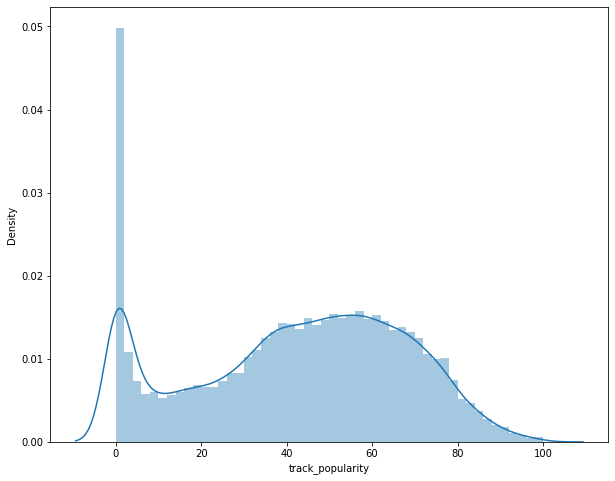

In [22]:
# Plot histogram of popularity variable

plt.figure(figsize=(10,8))
sns.distplot(spotify_df.track_popularity, bins=50)

In [23]:
#Check skewness of popularity variable
spotify_df['track_popularity'].skew()

-0.2334845739328685

In [24]:
# Get the statistics of tracks popularity
 
spotify_df['track_popularity'].describe()

count    32828.000000
mean        42.483551
std         24.980476
min          0.000000
25%         24.000000
50%         45.000000
75%         62.000000
max        100.000000
Name: track_popularity, dtype: float64

In [25]:
# Introduce binary classification of tracks based on whether the popularity is > 50 or not for 1 and 0 respectively.

spotify_df['track_popularity'] = np.where((spotify_df['track_popularity'] < 50 ), 0, 1)                          


In [26]:
# Get the statistics of new feature of tracks popularity
 
print('Music Track Popularity Classes: \n', spotify_df.track_popularity.value_counts(),'\n')
print(spotify_df['track_popularity'].describe())

Music Track Popularity Classes: 
 0    18368
1    14460
Name: track_popularity, dtype: int64 

count    32828.000000
mean         0.440478
std          0.496452
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: track_popularity, dtype: float64


*After this classification, we notice that the popularity feature is not biaised.*

In [27]:
# encoding track_genres and track_subgenres as a categorical feature

from sklearn.preprocessing import LabelEncoder

# Genres 'pop' 'rap' 'rock' 'latin' 'r&b' and 'edm'.
enc = LabelEncoder()
genre = enc.fit(spotify_df['playlist_genre'].unique())
genre_classes = genre.classes_
spotify_df['playlist_genre'] = genre.transform(spotify_df['playlist_genre'].values)

# Subgenres encoding
spotify_df['playlist_subgenre']=enc.fit_transform(spotify_df['playlist_subgenre'])

spotify_df.sample(4)

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
32782,4yLOB87ABVGslKVNRq3qPl,Don't Hold Us - Radio Edit,Thomas Newson,0,6gEelxWm1jvU99mCfKlMx0,Don't Hold Us,2014-03-10,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,0,18,0.536,0.936,2,-4.306,1,0.0470,0.00547,0.000155,0.0825,0.624,127.938,189375
15066,4JXfNOePhdgMOI7KZ1L25U,Breath,Breaking Benjamin,1,2usyeZYdUHKlNHKDKgAYSo,Phobia (Clean Version),2006-01-01,Hard Rock Workout,3YouF0u7waJnolytf9JCXf,5,7,0.347,0.868,5,-4.145,0,0.0467,0.00012,0.000273,0.0845,0.313,182.851,218467
26387,7JJuFG4gELSwccbMXsvTVS,Table For Two,Elli Ingram,0,0gtgulhWnuqAEXBjUi7QdX,Love You Really,2017-09-15,Neo-Jazz Soul RnB & Afro,48AzM7l4M02DBYd2N3IFLP,3,13,0.804,0.556,4,-5.201,0,0.0727,0.41700,0.000057,0.2130,0.431,114.044,243933
19705,5yY9lUy8nbvjM1Uyo1Uqoc,Life Is Good (feat. Drake),Future,1,5uCEoLCj3ZZZ1EtzQdQWVl,Life Is Good (feat. Drake),2020-01-10,2020 Hits & 2019 Hits – Top Global Tracks 🔥🔥🔥,4JkkvMpVl4lSioqQjeAL0q,1,11,0.676,0.609,2,-5.831,0,0.4810,0.07060,0.000000,0.1520,0.508,142.037,237735


In [28]:
# Extract the year part of the date and merge with the main dataframe.

track_album_release_yr = spotify_df['track_album_release_date'].str.split("-", n=1, expand=True)
spotify_df['track_album_release_date'] = track_album_release_yr[0]

# Rename the release date to year and modify the datatype to integer
spotify_df['track_album_release_date'] = spotify_df['track_album_release_date'].astype(int)
spotify_df.rename(columns = {'track_album_release_date':'track_album_release_year'}, inplace = True)

spotify_df.dtypes

track_id                     object
track_name                   object
track_artist                 object
track_popularity              int64
track_album_id               object
track_album_name             object
track_album_release_year      int64
playlist_name                object
playlist_id                  object
playlist_genre                int64
playlist_subgenre             int64
danceability                float64
energy                      float64
key                           int64
loudness                    float64
mode                          int64
speechiness                 float64
acousticness                float64
instrumentalness            float64
liveness                    float64
valence                     float64
tempo                       float64
duration_ms                   int64
dtype: object

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn

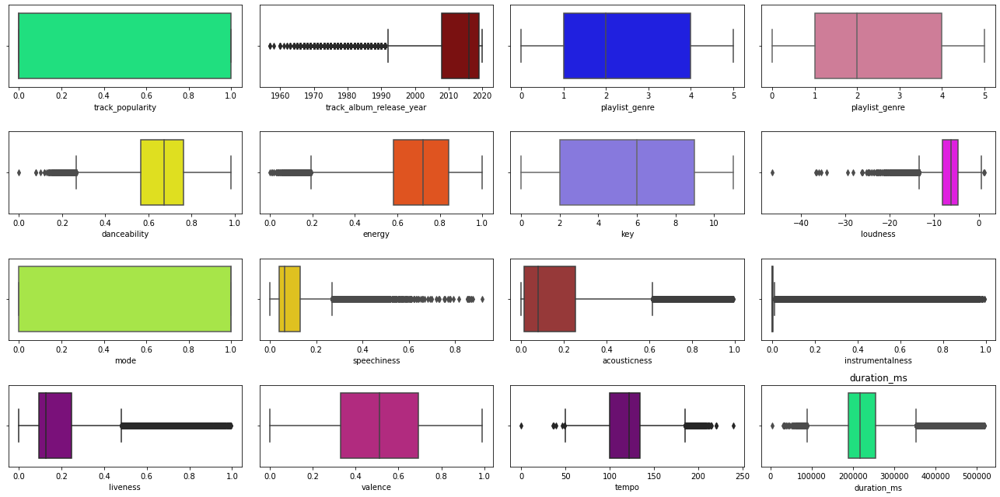

In [29]:
# Investigate outliers in the dataset.

fig, axes = plt.subplots(nrows = 4, ncols = 4, figsize = (18,9))

cols = ['track_popularity','track_album_release_year', 'playlist_genre', 'playlist_genre','danceability','energy','key','loudness',
        'mode','speechiness','acousticness','instrumentalness',
        'liveness','valence','tempo','duration_ms']

colors = ['#00FF7F', '#8B0000', '#0000FF', '#DB7093', '#FFFF00', '#FF4500', '#7B68EE', '#FF00FF',
          '#ADFF2F', '#FFD700', '#A52A2A', '#C71585', '#8B008B', '#C71585', '#780080', '#00FF7F']

for col, color, ax in zip(cols, colors, axes.flatten()):
    sns.boxplot(spotify_df[col], ax = ax, color = color)
    plt.title(col)
    
plt.tight_layout()

In [30]:
# Selecting the outliers using interquatile range.

q1 = spotify_df.quantile(0.25)
q3 = spotify_df.quantile(0.75)
iqr = q3 - q1

outliers_df = spotify_df[((spotify_df < (q1 - 1.5 * iqr)) | (spotify_df > (q3 + 1.5 * iqr))).any(axis = 1)]

# calculating the percentage of the outliers i nthe dataset
round((outliers_df.shape[0] / spotify_df.shape[0]) * 100, 2)

46.02

In [31]:
# Eliminating the outliers

spotify_df = spotify_df[~((spotify_df < (q1 - 1.5 * iqr)) | (spotify_df > (q3 + 1.5 * iqr))).any(axis = 1)]
spotify_df.shape

(17720, 23)

### 3.3 Univariate Analysis

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7ff63850deb8>,
      dtype=object)

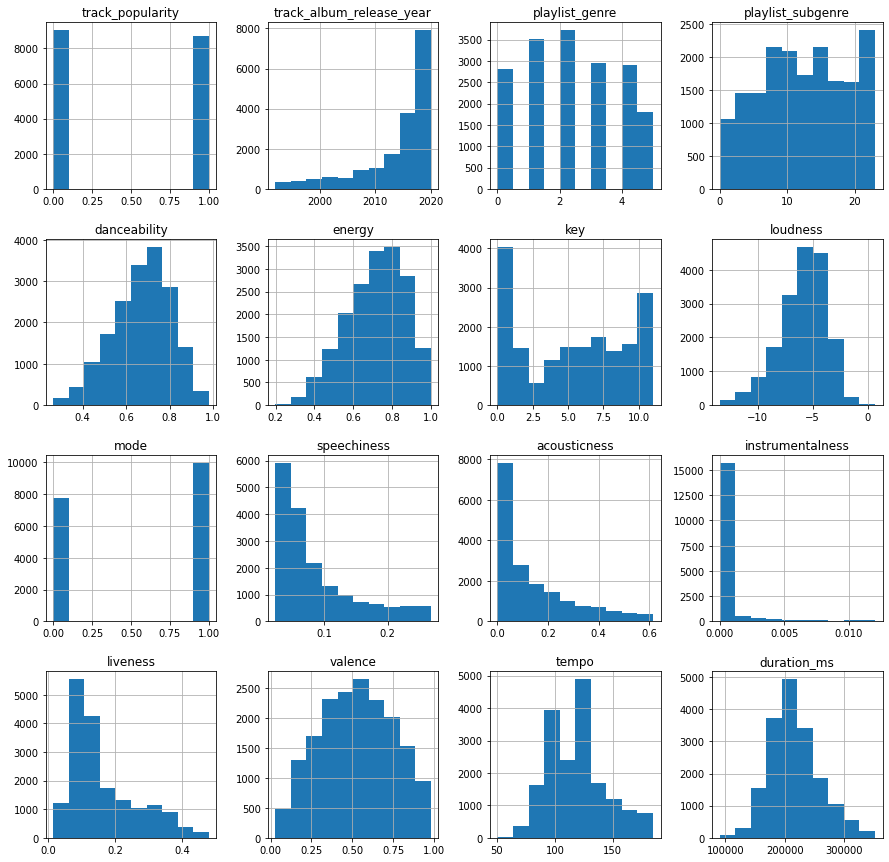

In [32]:
# Check on the distribution of the numerical variables in the dataset.

spotify_df.hist(figsize=(15,15))

*From the above, save for 'duration', 'valence' and 'popularity' (to some extent) all the other features (apart from the binary field 'mode') are skewed hence the need for normalization.*

*The distribution of 4 categories of popularity is evenly distributed over the tracks.*

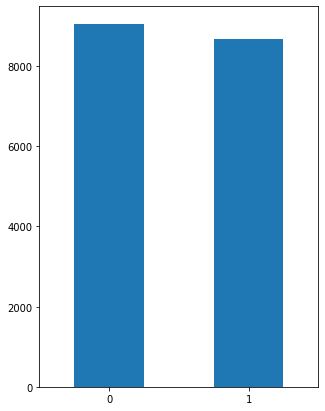

In [33]:
# Distribution of the popularity codes

plt.figure(figsize = (5, 7))
spotify_df.track_popularity.value_counts()[:10].plot(kind = 'bar', rot = 0)

plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


0.03974032463142974


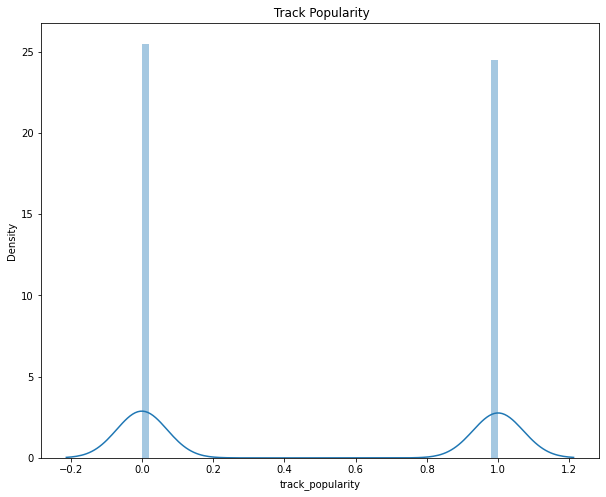

In [34]:
#Plot histogram of track_popularity variable

plt.figure(figsize=(10,8))
plt.title(" Track Popularity")
sns.distplot(spotify_df.track_popularity, bins=50)

print(spotify_df['track_popularity'].skew())

We notice that the imbalance that was present before has been eliminated by encoding the popularity feature.

### 3.4 Bivariate Analysis

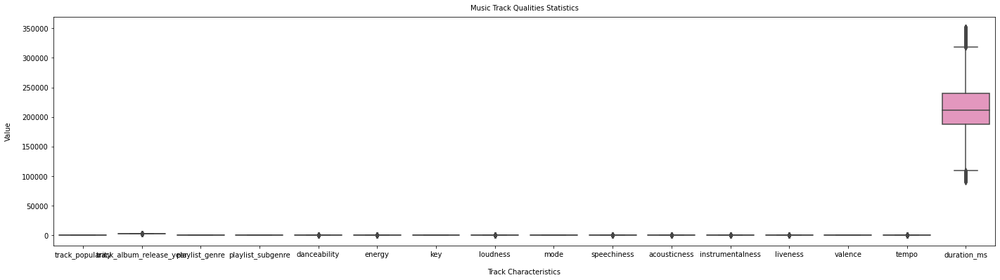

In [35]:
# Box plot comparison of track genres

plt.figure(figsize=(24, 6))
#sns.boxplot(x='playlist_genre', y='track_popularity', data = spotify_df, saturation=0.65)
sns.boxplot(data = spotify_df, saturation=0.65)
plt.title('Music Track Qualities Statistics', fontsize=10, y=1.01)
plt.ylabel("Value", labelpad=14)
plt.xlabel("Track Characteristics", labelpad=14)
plt.show()

In [36]:
# From the above, there is a very big variation betweeen data values for track duration and the others.
# we will convert the ms to min and rename the col.

spotify_df['duration_ms'] = round(spotify_df['duration_ms']/60000,2)
spotify_df.rename(columns = {'duration_ms':'duration_min'}, inplace = True)

*1. It is necessary to carry out standardization and normalization on the dataset before training the model as some variables eg loudness, tempo and duration_ms are on relatively high numerical scales. For duration_ms, we chose to convert the measure into minutes thereby reducing the scale considerably.*

*2. In addition to the above, we also note that the dataset does not have high dimensionality and so there would be no need for any reduction.*

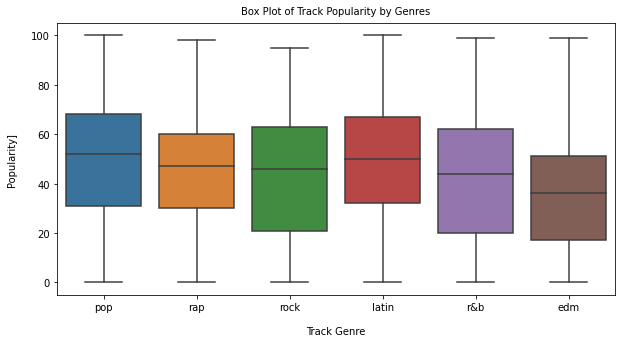

In [37]:
# Box plot comparison of track genres

plt.figure(figsize=(10, 5))
sns.boxplot(x='playlist_genre', y='track_popularity', data = spot_df, saturation=0.65)
plt.title("Box Plot of Track Popularity by Genres", fontsize=10, y=1.01) 
plt.ylabel("Popularity]", labelpad=14)
plt.xlabel("Track Genre", labelpad=14)
plt.show()

*The box plots reveal that Genre 2, 3 and 5  i.e. (pop, r&b and rock) are more popular than the rest*

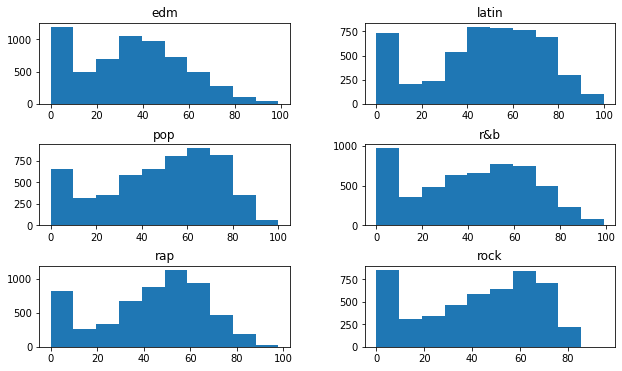

In [38]:
# Distribution for each of the track_genre and subgenre

spot_df.hist('track_popularity', by = 'playlist_genre', rot = 0, figsize = (10, 6))
plt.show()

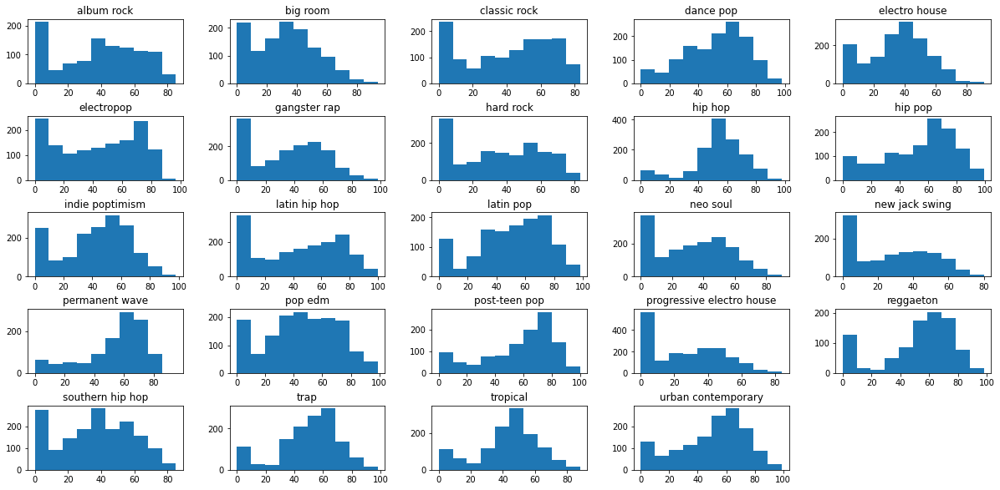

In [39]:
spot_df.hist('track_popularity', by = 'playlist_subgenre', rot = 0, figsize = (20, 10))
plt.show()

*The popularity of the tracks is fairly distributed across all genres and subgenres featuring in the dataset, with popularity between 20 and 80 being most frequent.*

In [40]:
# track genre by year of release

genre_trends = spotify_df[['track_album_release_year', 'playlist_genre','track_popularity']]
pivot_genre = genre_trends.groupby(['playlist_genre','track_album_release_year']).mean().unstack()
pivot_genre.style.highlight_max(color='green').highlight_min(color='red')

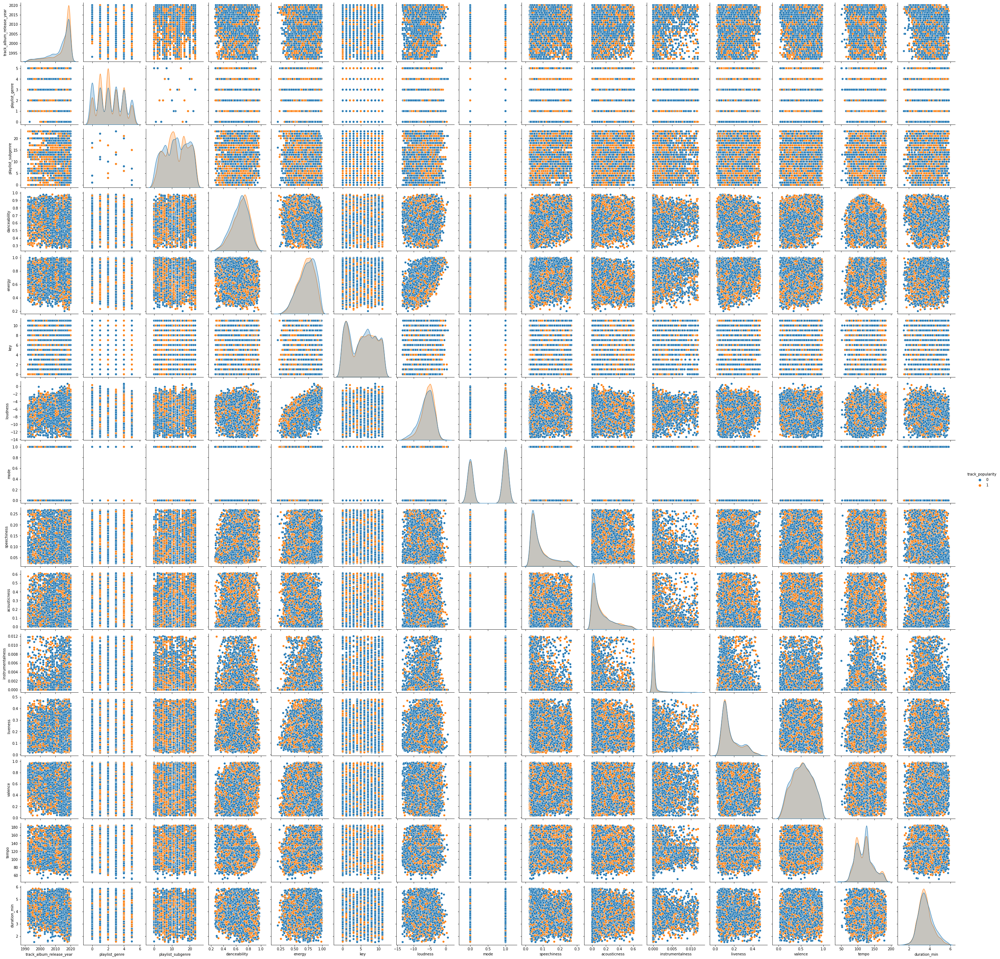

In [41]:
 # plotting multiple pairwise bivariate distributions in a dataset with respect to track popularity.
 
 sns.pairplot(spotify_df, hue='track_popularity')

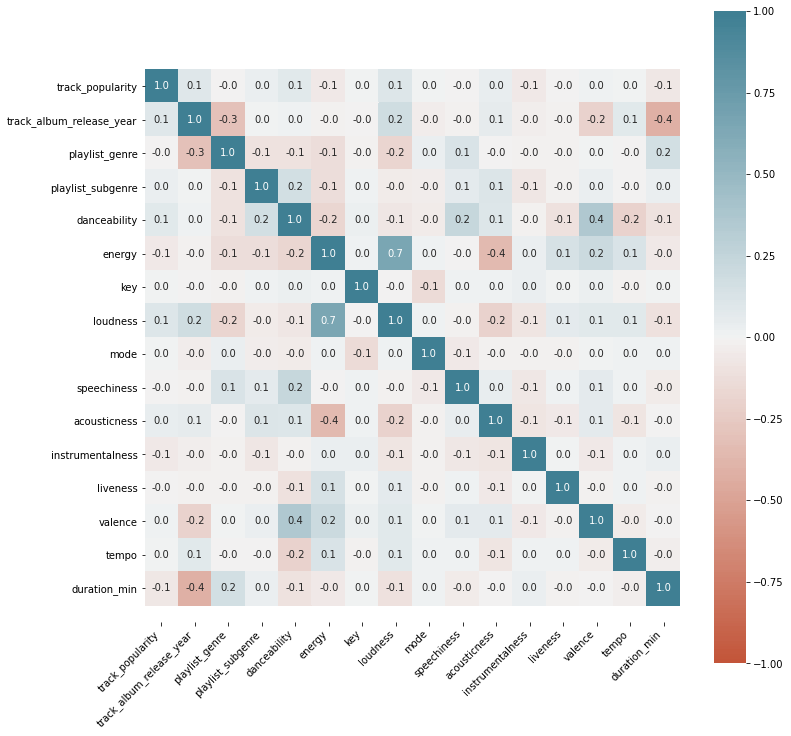

In [42]:
# checking the correlations between the numerical variables

corr = spotify_df.corr()

# plotting the correlations onto a heatmap
plt.figure(figsize=(12,12))
ax = sns.heatmap(
    corr,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True, annot=True,
    fmt='.1f'
)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)

ax.set_ylim(len(corr)+0.5, -0.5);

* *Energy and loudness are faily related, with a coefficient of 0.7. We also notice that energy and acousticness are also fairly related and we will therefore drop the common feature; energy to have a clean dataset which we can use for modeling.*

In [43]:
# Drop energy feature and write the shaped dataframe to .csv for permanency

spotify_df.drop(columns='energy', inplace=True)

#drop other features not to be used in the modeling but sure to have a copy for future reference
spotify2_df = spotify_df.copy()
obj_var = spotify_df.select_dtypes(include = ['object']).columns.to_list()
spotify_df.drop(columns=obj_var, inplace=True)
spotify_df.sample(4)

# write to .csv
spotify_df.to_csv('spotify_df.csv', index=False)

In [44]:
spotify_df.columns

Index(['track_popularity', 'track_album_release_year', 'playlist_genre',
       'playlist_subgenre', 'danceability', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'duration_min'],
      dtype='object')

## **4. Data Modeling**

We will subject our datasets to machine learning algorithms to specifically find out how effective we can apply the them to;

1. predict the popularity of the tracks given the track features.
2. effectively cluster the tracks based on the given features.

In [45]:
# load the shaped dataframe

df=pd.read_csv('spotify_df.csv')
df.head(3)

,track_popularity,track_album_release_year,playlist_genre,playlist_subgenre,danceability,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_min
0,1,2019,2,3,0.748,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,3.25
1,1,2019,2,3,0.726,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,2.71
2,1,2019,2,3,0.675,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,2.94


In [46]:
# Split into features X and label y

X = df.iloc[:, 1:16].values     # Independent/predictor variables
y = df.iloc[:, 0].values       # Dependent/label variable

print('Shape of X', X.shape)
print('Shape of y', y.shape)

Shape of X (17720, 14)
Shape of y (17720,)


In [47]:
# Split into train / test sets in the ratio 70/30

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [48]:
# Scaling our features to achieve normalisation 

# RobustScaler for outliers handling

from sklearn import preprocessing

r_scaler = preprocessing.RobustScaler() 
X_train = r_scaler.fit_transform(X_train) 
X_test= r_scaler.transform(X_test)

In [49]:
# StandardScaler to follow Std. normal distribution 

s_scaler = preprocessing.StandardScaler()
X_train = s_scaler.fit_transform(X_train) 
X_test= s_scaler.transform(X_test)

### **4.1 Classification Analysis** 

We will test our data using different classification analysis viz;
1. K-Nearest Neighbors (KNN)
2. Decision Tree
3. Logistic Regression
4. Support Vector Machine (SVM)
5. Gaussian Naive Bayes (NB)

In [50]:
# importing libraries 

# Classification algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# ensemble algorithms
from sklearn.ensemble import BaggingClassifier           # Bagging Meta-Estimator Classifier
from sklearn.ensemble import RandomForestClassifier      # RandomForest Classifier 
from sklearn.ensemble import AdaBoostClassifier          # AdaBoost Classifier
from sklearn.ensemble import GradientBoostingClassifier  # AdaBoost GradientBoostingClassifier
import xgboost as xgb                                    # Importing the XGBoost library

In [51]:
# instantiating classifiers

# Base classifiers
log_reg = LogisticRegression()
nb = GaussianNB()
tree = DecisionTreeClassifier()
knn = KNeighborsClassifier()
svm = SVC()

# Bagging classifiers
bagging_meta_classifier = BaggingClassifier()
random_forest_classifier = RandomForestClassifier()

# Boosting classifiers
ada_boost_classifier = AdaBoostClassifier()
gbm_classifier = GradientBoostingClassifier() 
xg_boost_classifier = xgb.XGBClassifier() 

In [52]:
# fitting classifiers to our training data and making predictions on the test set of our independent variables
log_reg.fit(X_train, y_train)
nb.fit(X_train, y_train)
tree.fit(X_train, y_train)
knn.fit(X_train, y_train)
svm.fit(X_train, y_train)

# Bagging Classifiers
# ---
bagging_meta_classifier.fit(X_train, y_train)
random_forest_classifier.fit(X_train, y_train)

# Boosting Classifiers
# ---
ada_boost_classifier.fit(X_train, y_train)
gbm_classifier.fit(X_train, y_train)
xg_boost_classifier.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [53]:
# making predictions
log_y_pred = log_reg.predict(X_test)
nb_y_pred = nb.predict(X_test)
tree_y_pred = tree.predict(X_test)
knn_y_pred = knn.predict(X_test)
svm_y_pred = svm.predict(X_test)

# Bagging Classifiers
# ---
bagging_y_classifier = bagging_meta_classifier.predict(X_test) 
random_forest_y_classifier = random_forest_classifier.predict(X_test) 

# Boosting Classifiers
# ---
ada_boost_y_classifier = ada_boost_classifier.predict(X_test)
gbm_y_classifier = gbm_classifier.predict(X_test)
xg_boost_y_classifier = xg_boost_classifier.predict(X_test)

*Evaluating classification models.*

In [54]:
# Classification report for each classifier to assess performance
from sklearn.metrics import classification_report

# classification report for Logistic Regression
print("Logistic Regression classification report:")
print(classification_report(y_test, log_y_pred))
print()

# classification report for Gaussian Naive Bayes Classifier
print("Gaussian Naive Bayes classification report:")
print(classification_report(y_test, nb_y_pred))
print()

# classification report for Decision Tree Classifier
print("Decision Tree classification report:")
print(classification_report(y_test, tree_y_pred))
print()

# classification report for K-Nearest Neighbors Classifier
print("K-Nearest Neighbors classification report:")
print(classification_report(y_test, knn_y_pred))
print()

# classification report for Support Vector Machine Classifier
print("Support Vector Machine classification report:")
print(classification_report(y_test, svm_y_pred))
print()

# Classification report for Bagging Classifiers
print('Bagging Meta Classifier:')
print(classification_report(y_test, bagging_y_classifier)) 

print('Random Forest Classifier:')
print(classification_report(y_test, random_forest_y_classifier)) 


# Classification report for Boosting Classifiers
print('Ada Boost Classifier:')
print(classification_report(y_test, ada_boost_y_classifier)) 

print('GBM Classifier:')
print(classification_report(y_test, gbm_y_classifier)) 

print('XGBoost Classifier:')
print(classification_report(y_test, xg_boost_y_classifier)) 

Logistic Regression classification report:
              precision    recall  f1-score   support

           0       0.60      0.58      0.59      2726
           1       0.57      0.59      0.58      2590

    accuracy                           0.58      5316
   macro avg       0.58      0.58      0.58      5316
weighted avg       0.58      0.58      0.58      5316


Gaussian Naive Bayes classification report:
              precision    recall  f1-score   support

           0       0.63      0.45      0.52      2726
           1       0.55      0.72      0.63      2590

    accuracy                           0.58      5316
   macro avg       0.59      0.58      0.58      5316
weighted avg       0.59      0.58      0.57      5316


Decision Tree classification report:
              precision    recall  f1-score   support

           0       0.62      0.60      0.61      2726
           1       0.59      0.61      0.60      2590

    accuracy                           0.60      5316
  

We were able to achieve a high score of 0.70 with Random Forest Classifier.

Accuracy for the other classification models range from 0.58 to 0.67, which is below our target performance.

### **4.2 Cluster Analysis** 
We will first employ Centroid Clustering method using K-Means clustering algorithm to discover any hidden groupings of the tracks.


In [55]:
# Get the features into X

# load the shaped dataframe
df =pd.read_csv('spotify_df.csv')
df.head(3)

,track_popularity,track_album_release_year,playlist_genre,playlist_subgenre,danceability,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_min
0,1,2019,2,3,0.748,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,3.25
1,1,2019,2,3,0.726,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,2.71
2,1,2019,2,3,0.675,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,2.94


In [56]:
# read only the features specific to music composition into X

X=df[['danceability', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_min']]

In [57]:
# Scale features

s_scaler = preprocessing.StandardScaler()
X_scaled = s_scaler.fit_transform(X) 

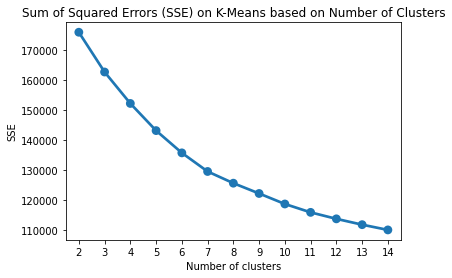

In [58]:
# getting the optimum value of k for our KMeans model using the Elbow Method
from sklearn.cluster import KMeans

# ensure reproducability of this procedure
np.random.seed(42)
inertia = []

for i in range(2, 15):
  # Instantiate the model
    model = KMeans(n_clusters=i, random_state=42)
    
  # Fit The Model
    model.fit(X_scaled)
    
  # Extract the error of the model
    inertia.append(model.inertia_)
    
# Visualize the model

sns.pointplot(x=list(range(2, 15)), y=inertia)
plt.title('Sum of Squared Errors (SSE) on K-Means based on Number of Clusters')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.show()

*Using the elbow method, we are able to pick 5 being the optimal number of clustes for tracks data.*

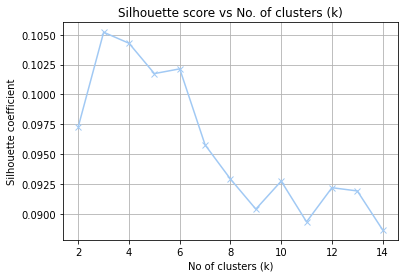

In [59]:
# Using the Silhouette Analysis to determine the number of clusters

from sklearn.metrics import silhouette_score

silhouette = [] # list of separation distance between the resulting clusters for each value of k 
K = range(2, 15)

for k in K:
    kmeans = KMeans(n_clusters=k,random_state=42)
    kmeans.fit(X_scaled)
    silhouette.append(silhouette_score(X_scaled, kmeans.labels_))

# Plotting the Silhouette.
plt.plot(range(2, 15), silhouette, 'bx-')
plt.title('Silhouette score vs No. of clusters (k)')
plt.xlabel('No of clusters (k)')
plt.ylabel('Silhouette coefficient')
plt.grid(True);

*Similarly, reading from the silhouette analysis, the silhouette coefficient was highest when K = 5, suggesting 5 clusters as the optimal number of clusters for the data.*

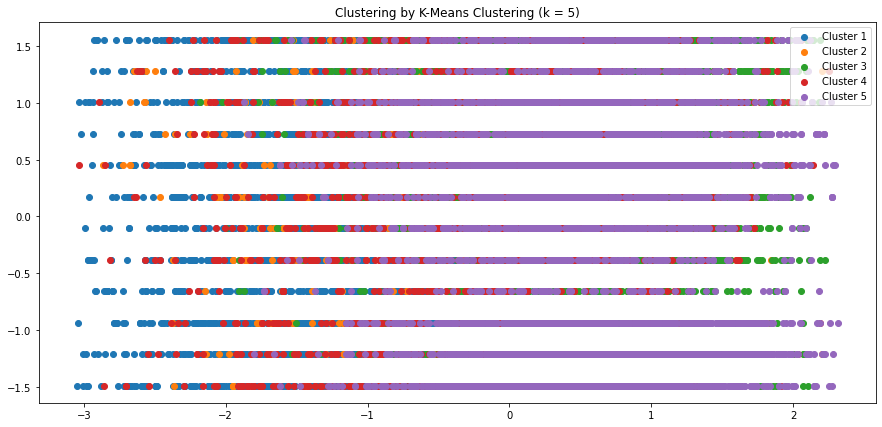

In [60]:
# getting the KMeans scatter plot with 5 clusters

kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(X_scaled)

kmeans_pred = kmeans.labels_
kmeans_clust = np.unique(kmeans_pred)

# getting the cluster labels
myLabels = ['Cluster 1', 'Cluster 2','Cluster 3', 'Cluster 4', 'Cluster 5']

plt.figure(figsize = (15, 7))
for grp in kmeans_clust:
    row_ix = np.where(kmeans_pred == grp)
    plt.scatter(X_scaled[row_ix, 0], X_scaled[row_ix, 1], label = grp)
    
plt.title("Clustering by K-Means Clustering (k = 5)")
plt.legend(myLabels,loc='upper right')
plt.show()

In [61]:
# Predict the cluster from the data and save it
cluster_pred = kmeans.predict(X_scaled)
cluster_pred

array([4, 1, 2, ..., 0, 0, 0], dtype=int32)

In [62]:
# Add to the dataframe and show the result
df['track_cluster'] = cluster_pred
df.head()

,track_popularity,track_album_release_year,playlist_genre,playlist_subgenre,danceability,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_min,track_cluster
0,1,2019,2,3,0.748,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,3.25,4
1,1,2019,2,3,0.726,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,2.71,1
2,1,2019,2,3,0.675,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,2.94,2
3,1,2019,2,3,0.718,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,2.82,4
4,1,2019,2,3,0.650,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,3.15,4


In [63]:
# Sample tracks in a given cluster, say 'Cluster 3' or 'Cluster 4' etc

cl_0 = spot_df[spot_df.index.isin(df[df.track_cluster == 0].index)]
cl_3 = spot_df[spot_df.index.isin(df[df.track_cluster == 1].index)]
cl_4 = spot_df[spot_df.index.isin(df[df.track_cluster == 2].index)]

In [64]:
# determine unique genres/subgenres in a given sector

print('Cluster 3 : \n')
print('Genre : ', cl_3.playlist_genre.unique())
print('Subgenre :', cl_3.playlist_subgenre.unique(),'\n')

print('Cluster 4 : \n')
print('Genre : ', cl_4.playlist_genre.unique())
print('Subgenre :', cl_4.playlist_subgenre.unique(),'\n')

Cluster 3 : 

Genre :  ['pop' 'rap' 'rock' 'latin']
Subgenre : ['dance pop' 'post-teen pop' 'electropop' 'indie poptimism' 'hip hop'
 'southern hip hop' 'gangster rap' 'trap' 'album rock' 'classic rock'
 'permanent wave' 'hard rock' 'tropical' 'latin pop'] 

Cluster 4 : 

Genre :  ['pop' 'rap' 'rock' 'latin']
Subgenre : ['dance pop' 'post-teen pop' 'electropop' 'indie poptimism' 'hip hop'
 'southern hip hop' 'gangster rap' 'trap' 'album rock' 'classic rock'
 'permanent wave' 'hard rock' 'tropical' 'latin pop'] 



*From the above sample examination we notice that  all  the  genres and subgenres are common in both clusters Cluster 3 and 4 indicating that the clustering is not purely on the genres/subgenres*

*We then use Hierarchical Clustering method using Agglomerative Clustering algorithm on the same dataset.*


In [65]:
# Fitting agglomerative clustering with predetermined 5 clusters 
from sklearn.cluster import AgglomerativeClustering as AC

# Create the agglomerative clusterer that we will use to perform cluster analysis.
ac_clusterer = AC(n_clusters=5).fit(X_scaled) 

# preview the labels created
labels = ac_clusterer.labels_
labels

array([0, 4, 1, ..., 4, 3, 1])

In [66]:
# Store labels to a new column of our dataframe for ease of grouping.

df['AC_Cluster'] = labels

# Drop the previous clustering field by K-Means
df.drop(columns='track_cluster', inplace=True)
df.sample(4)

,track_popularity,track_album_release_year,playlist_genre,playlist_subgenre,danceability,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_min,AC_Cluster
6739,0,2005,5,0,0.684,7,-11.465,1,0.0254,0.60300,0.003450,0.0702,0.483,90.003,4.21,4
17313,0,2015,0,18,0.543,11,-4.602,0,0.0812,0.00239,0.000009,0.1050,0.448,128.019,3.11,1
12294,1,2018,3,23,0.889,4,-6.365,0,0.0905,0.25900,0.000000,0.2520,0.544,86.003,3.01,2
8048,1,1992,5,7,0.457,7,-6.323,1,0.2570,0.01850,0.000002,0.0247,0.734,86.573,5.23,3


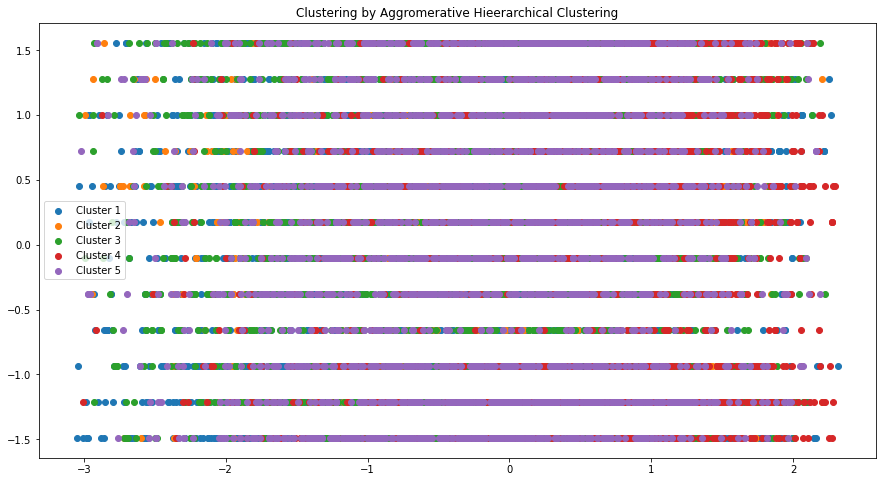

In [67]:
# Creating a scatter plot of the hierarchical cluster analysis

n_cluster = df['AC_Cluster'].unique()

plt.figure(figsize = (15, 8))
for cluster in n_cluster:
    row_ix = np.where(labels == cluster)
    plt.scatter(X_scaled[row_ix, 0], X_scaled[row_ix, 1], label = cluster)
    
plt.title("Clustering by Aggromerative Hieerarchical Clustering")
plt.legend(myLabels)
plt.show()

In [68]:
# create a dendrogram of agglomerative clustering analysis
from scipy.cluster import hierarchy as shc

plt.figure(figsize=(10, 8))
plt.title("Hierarchical Clustering Dendrogram")
dend = shc.dendrogram(shc.linkage(X_scaled, method='ward'))

In [ ]:
# Affinity Propagation
from sklearn.cluster import AffinityPropagation as AP

ap = AP()
ap.fit(X_scaled)

ap_pred = ap.predict(X_scaled)
ap_clusters = np.unique(ap_pred)

plt.figure(figsize = (8, 6))
for cluster in ap_clusters:
    row_ix = np.where(ap_pred == cluster)
    plt.scatter(X[row_ix, 0], X[row_ix, 1], label = cluster)

plt.title("Clustering by Affinity Propagation")
plt.legend()
plt.show()

## **5. Solution Reporting**

### **5.1  Summary of Findings**

* *Classification Modeling:*
  
  * Random Forest algorithm achieved the highest classification accuracy and  F1 Score with 0.70 accuracy.
  Other algorithms scores range for 0.58 to 0.67.
  * From the features correlation analysis, the following 6 features are key in influencing popularity of music tracks; 'release year', 'danceability', 'energy', 'loudness', 'instrumentalness' and 'duration'.

* *Cluster Analysis:*
  
  We have considered centroid method of clustering using K-Means algorithm and have been able to get 5 clusters of music tracks. Further analysis of the tracks is underway to determine the logic of classification (common features of the tracks in each cluster).



### **5.2 Challenging the Solution**
a) What can be done to improve the solution?

- Enhancing the features of the tracks with data, even from other sources, that is deemed directly related to track popularity such as the general rating of the artists.
- Comparing the performance of centroid method of clustering with others such as the Connectivity-based clustering (hierarchical clustering), Density-based clustering or Distribution-based clustering.

**Acknowledgements:**

1. The data for this project comes from Spotify via the [spotifyr package](https://www.rcharlie.com/spotifyr/) by Charlie Thompson, Josiah Parry, Donal Phipps, and Tom Wolff.

2. Many thanks to [AfterWork Data Science Fellowship](https://afterwork.ai) for the opportunity to fellowship with other upcoming Data Scientists and to grow in the profession. 